In [1]:
!pip install diffusers==0.11.1
!pip install -q accelerate transformers ftfy bitsandbytes==0.35.0 natsort safetensors xformers

import torch
from diffusers import StableDiffusionPipeline

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.9/524.9 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 32.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.2/251.2 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 92.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 MB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 77.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.0/167.0 MB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 102.7 MB/s eta 0:00:00


In [11]:
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

safety_checker/pytorch_model.fp16.safetensors not found


Fetching 29 files:   0%|          | 0/29 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [5]:
pipe.enable_attention_slicing()
pipe.enable_xformers_memory_efficient_attention()

In [3]:
seed = 2777

In [4]:
from PIL import Image

def grid_img(imgs, rows=1, cols=3, scale=1):
  assert len(imgs) == rows * cols

  w, h = imgs[0].size
  w, h = int(w*scale), int(h*scale)

  grid = Image.new('RGB', size=(cols*w, rows*h))
  grid_w, grid_h = grid.size

  for i, img in enumerate(imgs):
      img = img.resize((w,h), Image.ANTIALIAS)
      grid.paste(img, box=(i%cols*w, i//cols*h))
  return grid

Subject / object
- The subject/object is what you want to see in the image.
- A common mistake is not writing enough about the subjects, which leaves too much room for imagination. How do you want it to look? Any words to describe? What is wearing?
- We have to say (write) exactly what we want.
- A common trick is using celebrity names. It has a strong effect to control appearance.


  0%|          | 0/50 [00:00<?, ?it/s]

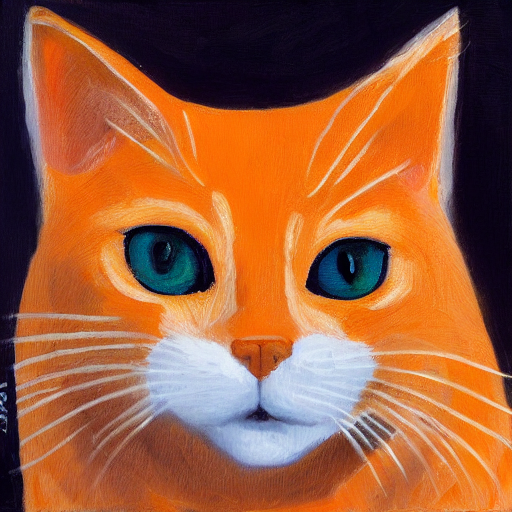

In [ ]:
prompt = 'an orange cat'

generator = torch.Generator('cuda').manual_seed(seed)
img = pipe(prompt, generator=generator).images[0]
img

Action and location
- What is doing?
- What is wearing? Is it on foot, running or floating in the air?
- How is the background?

  0%|          | 0/50 [00:00<?, ?it/s]

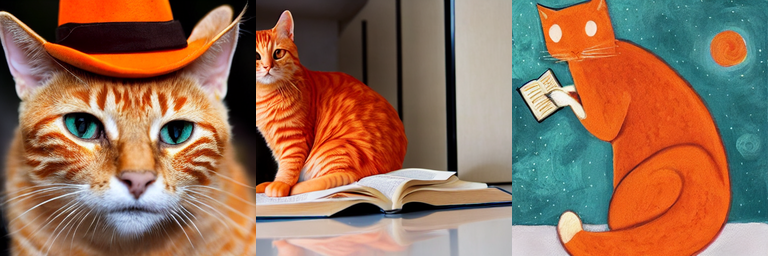

In [ ]:
prompts=['an orange cat wearing a hat',
         'an orange cat reading a book in the kitchen',
         'an orange cat reading a book i space'
         ]
generator=torch.Generator('cuda').manual_seed(seed)
imgs=pipe(prompts,generator=generator).images
grid=grid_img(imgs,rows=1,cols=len(prompts), scale=0.5)
grid

### Type

- It is the material used to make the image or artwork. Some examples: illustration, photography, oil painting, 3D rendering.
- A single keyword can drastically change the style.


  0%|          | 0/50 [00:00<?, ?it/s]

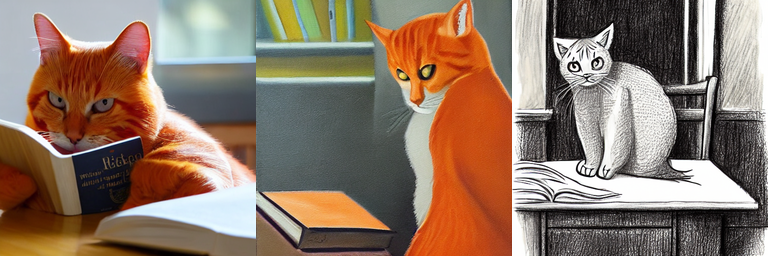

In [ ]:
prompt = ["photo of an orange cat reading a book in the kitchen",
          "oil painting of an orange cat reading a book in the kitchen",
          "drawing of an orange cat reading a book in the kitchen"]

generator = torch.Generator("cuda").manual_seed(seed)
imgs = pipe(prompt, generator=generator).images

grid = grid_img(imgs, rows=1, cols=len(prompt), scale=0.5)
grid

#### Useful keywords

> `Painting, Photo, Drawing, 3D rendering`, etc

> More specifics: `Oil painting, watercolor painting, Portrait, Sketch, Digital painting, Concept art, Ultra realistic illustration, Underwater portrait, Underwater steampunk`

['orange cat reading a book in space, oil painting', 'orange cat reading a book in space, digital painting', 'orange cat reading a book in space, underwater steampunk']


  0%|          | 0/50 [00:00<?, ?it/s]

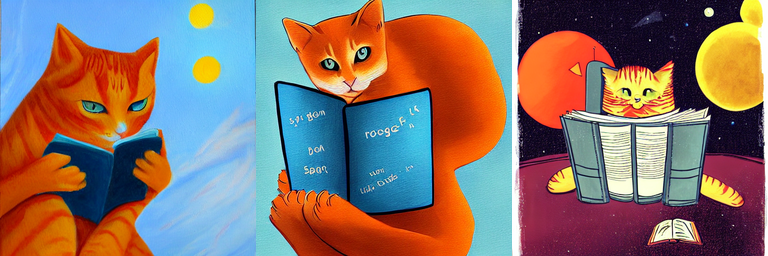

In [ ]:
base = 'orange cat reading a book in space'

m_ = [', oil painting',
      ', digital painting',
      ', underwater steampunk']

prompts = []

for m in m_:
  prompts.append(base + m)

print(prompts)

generator = torch.Generator("cuda").manual_seed(seed)
imgs = pipe(prompts, generator=generator).images

grid = grid_img(imgs, rows=1, cols=len(prompts), scale=0.5)
grid

### Style

- It is the artistic style of the image.
- Examples: impressionist, surrealist, pop art, etc.
- Sometimes you don't notice much difference if you add more specific terms. This can especially happen in cases where the effect of the keywords used was already implied by the previously used terms, such as the type or artist names.

['orange cat reading a book in space, Modernist', 'orange cat reading a book in space, impressionist', 'orange cat reading a book in space, realistic']


  0%|          | 0/50 [00:00<?, ?it/s]

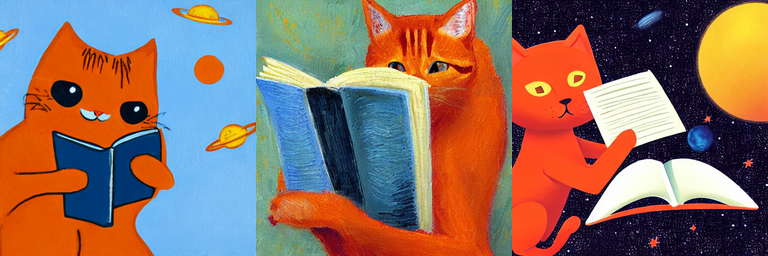

In [ ]:
base = "orange cat reading a book in space"

m_ = [", Modernist",
      ", impressionist",
      ", realistic"]

prompts = []

for m in m_:
  prompts.append(base + m)

print(prompts)

generator = torch.Generator("cuda").manual_seed(seed)
imgs = pipe(prompts, generator=generator).images

grid = grid_img(imgs, rows=1, cols=len(prompts), scale=0.5)
grid

#### Useful keywords

> `realistic, hyperrealistic, pop-art, modernist, art nouveau, surrealist`, etc.

### Colors

- You can control the overall color of the image by adding color or hue keywords.
- For example, if we want to add a little golden color to the image we can use the term `gold` or even "iridescent gold", which will give a very shiny golden tone

['a photograph of an orange cat reading a book in space, realistic, purple', 'a photograph of an orange cat reading a book in space, realistic, red colors', 'a photograph of an orange cat reading a book in space, realistic, black and white']


  0%|          | 0/50 [00:00<?, ?it/s]

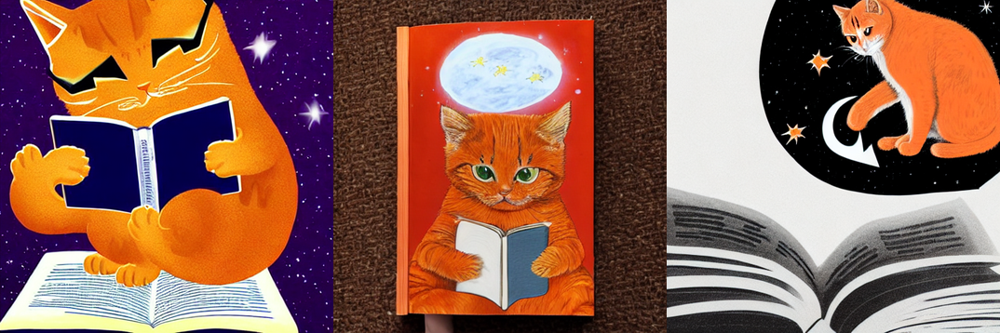

In [ ]:
base = "a photograph of an orange cat reading a book in space, realistic"

m_ = [", purple",
      ", red colors",
      ", black and white"]

prompts = []

for m in m_:
  prompts.append(base + m)

print(prompts)
seed=1200
generator = torch.Generator("cuda").manual_seed(seed)
imgs = pipe(prompts, generator=generator).images

grid = grid_img(imgs, rows=1, cols=len(prompts), scale=0.7)
grid

#### Useful keywords

> `vivid`, `tones` or `colors`, `bw` (black and white),`vintage`, `gold`, `silver`, etc.

### Artist

Adding the name of well-known artists can strongly influence the image. It allows you to use the style of a specific artist.

- It is also possible to use multiple artist names to mix their styles. For example, if we are generating an image of a person and want a more unique and artistic aesthetic, we can add the term Alphonse Mucha, a portrait painter from the 19th century.
- The names of artists work best for paintings, but if you want, you can try with other media to see the result. If you want to generate photos related to photography, then you could try to put names of famous photographers, so the image would have that style.
- Adding the names of artists who are best known for portraits of people may only work well if the subject is a person, as the model has been trained with images of that type of subject.
- You do not need to add the words "by" or "painted by"

['a painting of an orange cat reading a book in space, realistic, by Van Gogh', 'a painting of an orange cat reading a book in space, realistic, by Sandro Botticelli', 'a painting of an orange cat reading a book in space, realistic, by Monet', 'a painting of an orange cat reading a book in space, realistic, by Da Vinci']


  0%|          | 0/50 [00:00<?, ?it/s]

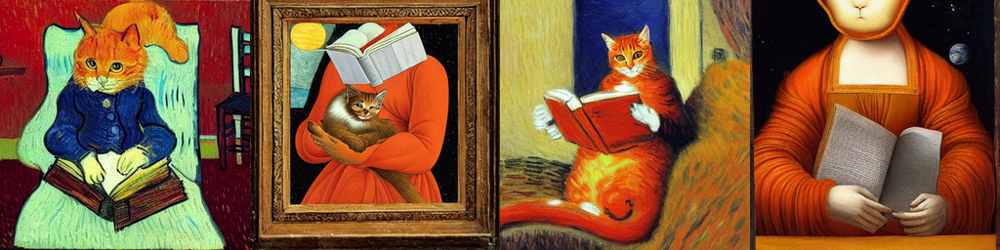

In [ ]:
base = "a painting of an orange cat reading a book in space, realistic"

m_ = [", by Van Gogh",
      ", by Sandro Botticelli",
      ", by Monet",
      ", by Da Vinci"]

prompts = []

for m in m_:
  prompts.append(base + m)

print(prompts)

generator = torch.Generator("cuda").manual_seed(seed)
imgs = pipe(prompts, generator=generator).images

grid = grid_img(imgs, rows=1, cols=len(prompts), scale=0.5)
grid

#### Useful keywords

> `Van Gogh`, `John Collier`, `Monet`, `Alphonse Mucha`, `Salvador Dali`, `Rembrandt`, `Da Vinci`, etc.

> List of artists available in Stable Diffusion: https://www.urania.ai/top-sd-artists

### Resolution

- It represents how sharp and detailed the image will be. For example, we can add `highly detailed` and `sharp focus` keywords. On the other hand, if we want a blurred image or a motion/blur effect we can use the keyword `blurred`

['a futuristic city on another planet at dawn, unreal engine', 'a futuristic city on another planet at dawn, sharp focus', 'a futuristic city on another planet at dawn, vray']


  0%|          | 0/50 [00:00<?, ?it/s]

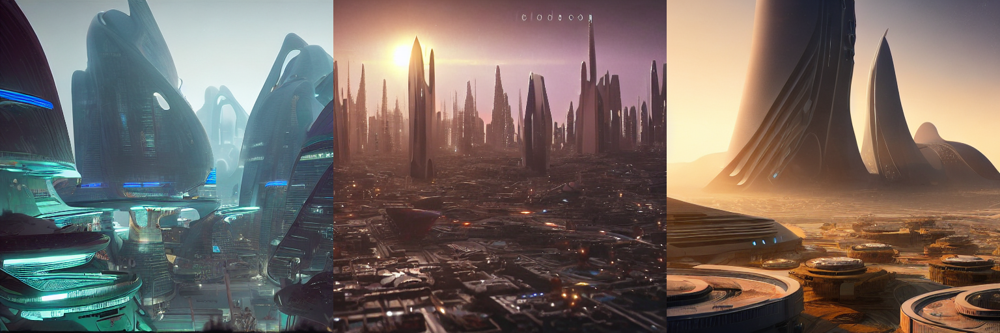

In [ ]:
base = "Mario Kart Rainbow Road PNG"

m_ = [", unreal engine",
      ", sharp focus",
      ", vray"]

prompts = []

for m in m_:
  prompts.append(base + m)

print(prompts)

generator = torch.Generator("cuda").manual_seed(seed)
imgs = pipe(prompts, generator=generator).images

grid = grid_img(imgs, rows=1, cols=len(prompts))
grid

#### Useful keywords

> `highly detailed`, `unreal engine` (detailed and realistic 3D), `sharp focus`, `hd`, `4k` or `8k`, `vray` (3D renderizations - good results for landscapes)

['an orange cat reading a book in space, realistic, unsplash', 'an orange cat reading a book in space, realistic, pixabay', 'an orange cat reading a book in space, realistic, pixiv']


  0%|          | 0/50 [00:00<?, ?it/s]

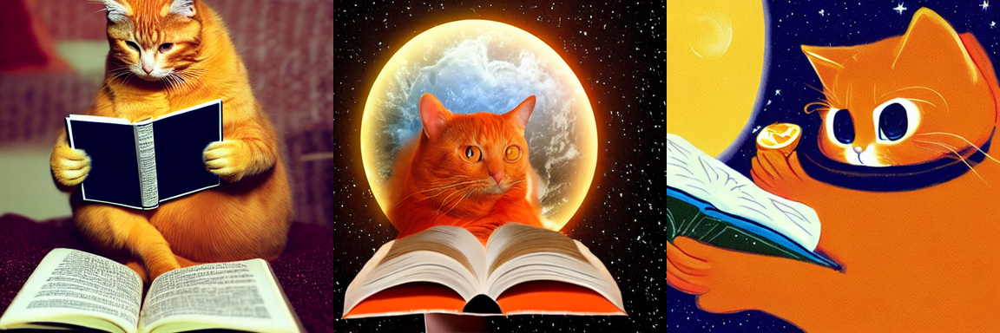

In [ ]:
base = "an orange cat reading a book in space, realistic"

m_ = [", unsplash",
      ", pixabay",
      ", pixiv"]

prompts = []

for m in m_:
  prompts.append(base + m)

print(prompts)

generator = torch.Generator("cuda").manual_seed(seed)
imgs = pipe(prompts, generator=generator).images

grid = grid_img(imgs, rows=1, cols=len(prompts), scale=0.75)
grid

#### Useful keywords

> `artstation` (art and design), `pixabay`, `unsplash`, `pexels`, `pixiv` (Japanese virtual community. It will return anime-style images)

### Other attributes

- Exampless: `sci-fi`, `stunningly beautiful`, `dystopian`, `dramatic` (it tends to increase emotional expressiveness in the face).



['photograph of an orange cat reading a book in space, realistic, unsplash, cinematic lighting', 'photograph of an orange cat reading a book in space, realistic, unsplash, rim lighting', 'photograph of an orange cat reading a book in space, realistic, unsplash, sunset']


  0%|          | 0/50 [00:00<?, ?it/s]

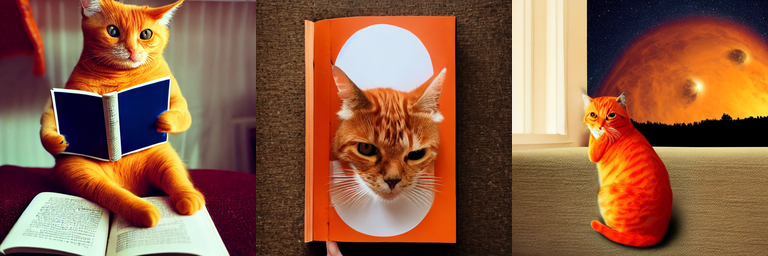

In [ ]:
base = "photograph of an orange cat reading a book in space, realistic, unsplash"

m_ = [", cinematic lighting",
      ", rim lighting",
      ", sunset"]

prompts = []

for m in m_:
  prompts.append(base + m)

print(prompts)

generator = torch.Generator("cuda").manual_seed(seed)
imgs = pipe(prompts, generator=generator).images

grid = grid_img(imgs, rows=1, cols=len(prompts), scale=0.5)
grid

['photo of an orange cat reading a book in space, realistic, unsplash, stunningly beautiful, award winning photo, tilt-shift', 'photo of an orange cat reading a book in space, realistic, dramatic', 'photo of an orange cat reading a book in space, realistic, low angle shot']


  0%|          | 0/50 [00:00<?, ?it/s]

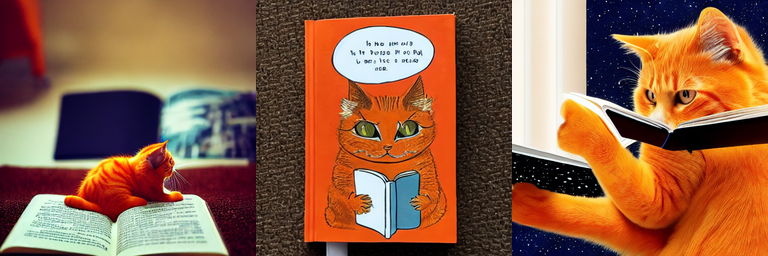

In [ ]:
base = "photo of an orange cat reading a book in space, realistic"

m_ = [", unsplash, stunningly beautiful, award winning photo, tilt-shift",
      ", dramatic",
      ", low angle shot"]

prompts = []

for m in m_:
  prompts.append(base + m)

print(prompts)

generator = torch.Generator("cuda").manual_seed(seed)
imgs = pipe(prompts, generator=generator).images

grid = grid_img(imgs, rows=1, cols=len(prompts), scale=0.5)
grid

#### Useful keywords


> Ilumination: `cinematic lighting`, `rim lighting`, `natural light`, `side light`, `sunset` or `golden hour`

> Change the vibe: `dramatic`, `sci-fi`, `dystopian`.

> Add more aesthetics:  `stunningly beautiful`, `award winning photo`, `masterpiece`.

> Terms associated with photography (camera millimeter): `35mm`, `50mm`, `80mm`, `85mm`, `wide angle`, `analog`, `fisheye lens`, `gopro`, `dslr`, `film`, `tilt-shift`.

> others: `blurred background`, `psychodelic`, `low angle shot`, `frontal face`, `expansive`, `detailed clothing`


---

> **Comments:**

- Some images look really good with just a few keywords. You often don't need to have a lot of keywords to get good images.
- If more terms are added you may get worse results. It is as if some terms generate more unnecessary "noise" to the images
- Just because you are using a keyword it doesn't mean it is effective.
- CLIP can handle 77 tokens
- The result does not depend only on the prompt, but also it depends on the parameters

  0%|          | 0/50 [00:00<?, ?it/s]

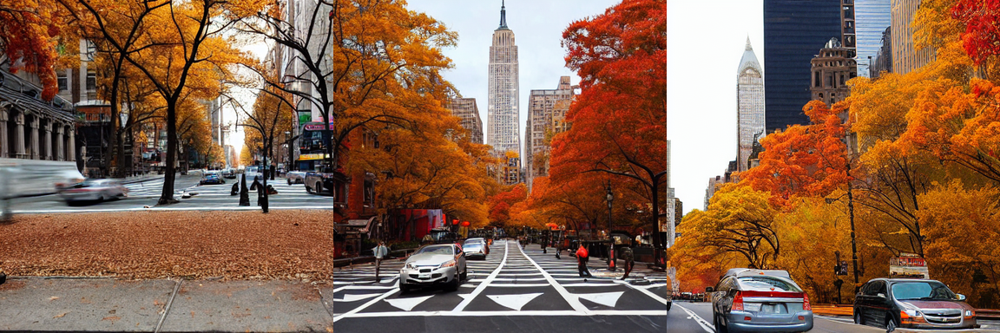

In [ ]:
prompt = "photo of autumn in new york without cars"
num_imgs = 3

imgs = pipe(prompt,
             num_images_per_prompt=num_imgs,
             generator=torch.Generator("cuda").manual_seed(seed)).images

grid = grid_img(imgs, rows=1, cols=num_imgs, scale=0.75)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

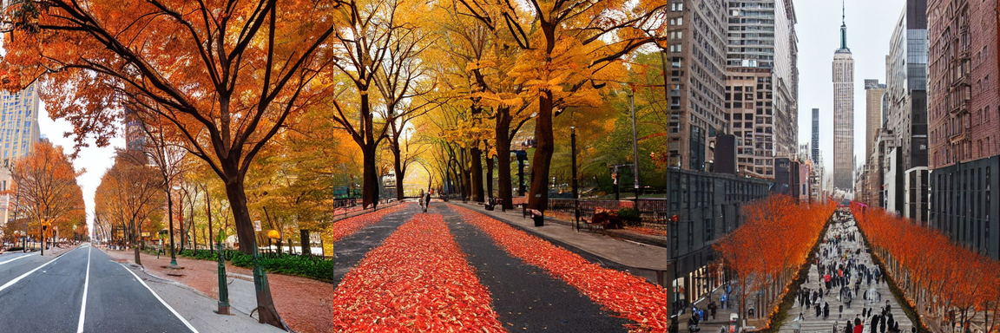

In [ ]:
prompt = "photo of autumn in new york without cars"
neg_prompt = "cars"
num_imgs = 3

imgs = pipe(prompt,
             num_images_per_prompt=num_imgs,
             negative_prompt = neg_prompt).images

grid = grid_img(imgs, rows=1, cols=num_imgs, scale=0.75)
grid

### Useful negative prompts

* **Defects in anatomy generation** - distorted body parts.
  * general examples: `bad anatomy, ugly, distorted face, deformed, desfigured, extra limbs`  
  * for badly drawn body parts: `poorly drawn hands, poorly drawn face, poorly drawn feet`

* **Improve resolution/definition** - remove blur or low definition
  * examples: `blurry, low quality, low definition, lowres`
  * if you want to improve the quality of an already generated image then what you are looking for is a super-resolution technique (*upscale*).

* **Object/subject partially out of frame** - object placement on the edges of the image
  * `out of frame, out of image, cropped, cut off`

* **Avoid adding signatures** - remove watermarks
  * Examples: `signature, watermark`

* **Contrast or brightness adjustment**  
`low contrast`, `underexposed`, `overexposed`

* For example, when you use the "photograph" keyword and the images are still coming out with a certain painting look, so you can add the term "painting" or "drawing" to the negative prompt to indicate that we want to avoid it.

### Universal negative prompt

> `bad anatomy, ugly, deformed, desfigured, distorted face, poorly drawn hands, poorly drawn face, poorly drawn feet`

  0%|          | 0/50 [00:00<?, ?it/s]

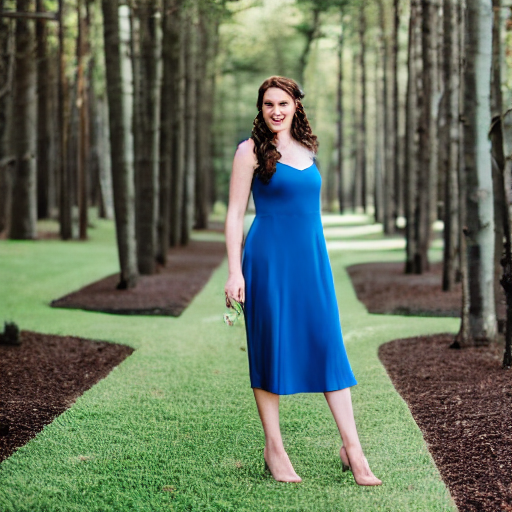

In [ ]:
prompt = "a young woman, front face, wearing a blue dress, natural light"
neg_prompt = "bad anatomy, ugly, deformed, desfigured, distorted face, poorly drawn hands, poorly drawn face, poorly drawn feet"

img = pipe(prompt,
           negative_prompt = neg_prompt,
          generator=torch.Generator("cuda").manual_seed(seed)).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

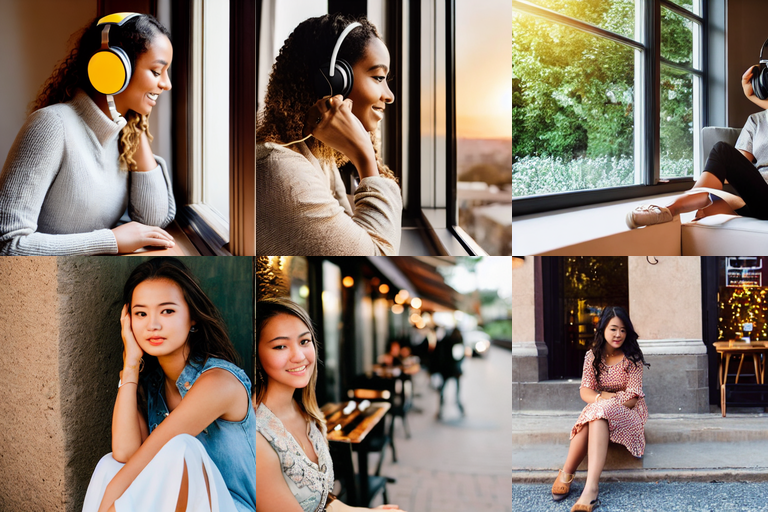

In [ ]:
prompt = ["photo of young woman sitting by window with headphones, realistic, golden hour, rim lighting",
          "a young female, highlights in hair, sitting outside restaurant, brown eyes, wearing a dress, side light"]

neg_prompt = ["ugly, deformed, disfigured, bad anatomy"] * len(prompt)
num_imgs = 3

seed = 777
generator = torch.Generator("cuda").manual_seed(seed)

imgs = pipe(prompt,
             num_images_per_prompt=num_imgs,
             negative_prompt = neg_prompt,
             generator=generator).images

grid = grid_img(imgs, rows=len(prompt), cols=num_imgs, scale=0.5)
grid

In [ ]:
##STABLEDIFFUSION V2

In [ ]:
sd21 = StableDiffusionPipeline.from_pretrained("", torch_dtype=torch.float16)

text_encoder/pytorch_model.fp16.safetensors not found


Fetching 22 files:   0%|          | 0/22 [00:00<?, ?it/s]

In [ ]:
from diffusers import EulerAncestralDiscreteScheduler

sd21.scheduler = EulerAncestralDiscreteScheduler.from_config(sd21.scheduler.config)
print(sd21.scheduler)

sd21 = sd21.to("cuda")
sd21.enable_attention_slicing()

EulerAncestralDiscreteScheduler {
  "_class_name": "EulerAncestralDiscreteScheduler",
  "_diffusers_version": "0.11.1",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "v_prediction",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "trained_betas": null
}



  0%|          | 0/35 [00:00<?, ?it/s]

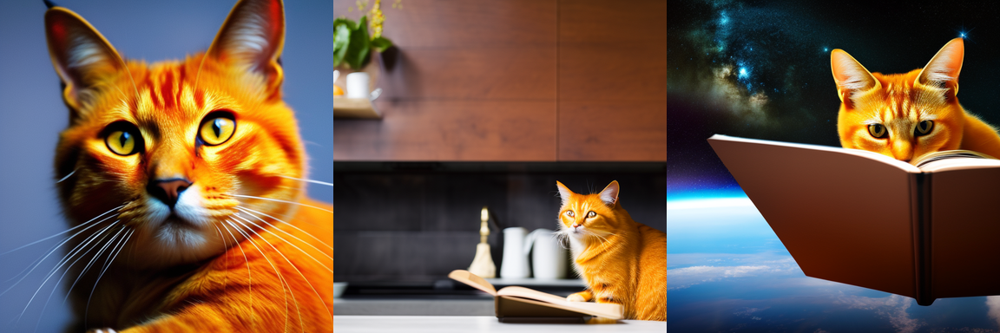

In [ ]:
prompt = ["an orange cat ",
          "an orange cat reading a book in the kitchen",
          "an orange cat reading a book in space"]

neg_prompt = ["bad anatomy, ugly, deformed, desfigured, distorted face, poorly drawn hands, poorly drawn face, poorly drawn feet"] * len(prompt)

imgs = sd21(prompt,
          negative_prompt=neg_prompt,
          generator=torch.Generator("cuda").manual_seed(seed),
          num_inference_steps=35).images

grid = grid_img(imgs, rows=1, cols=len(prompt), scale=0.5)
grid

  0%|          | 0/35 [00:00<?, ?it/s]

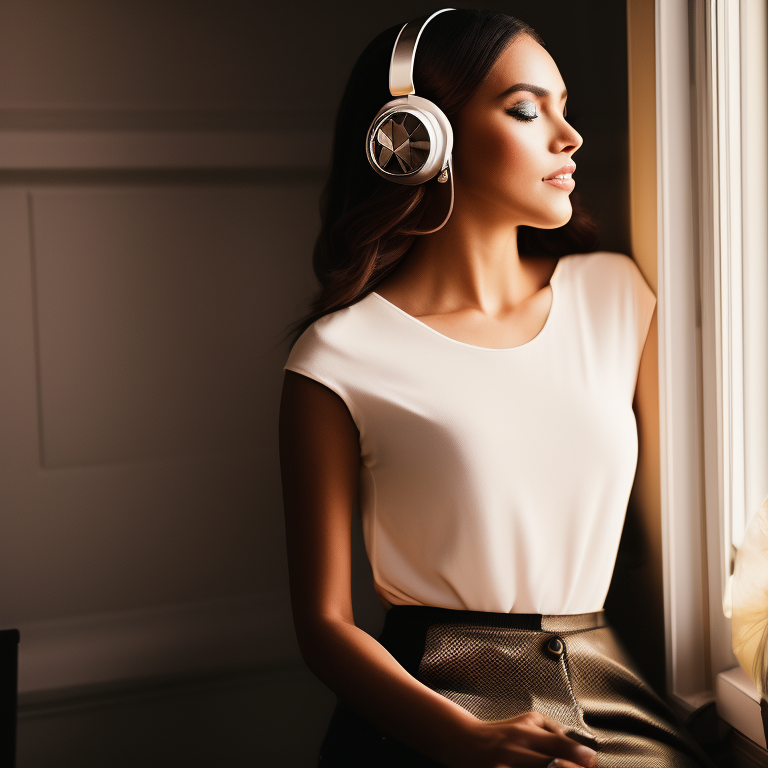

In [ ]:
prompt = "photo of young woman sitting by window with headphones, realistic, golden hour, rim lighting"
neg_prompt = "bad anatomy, ugly, deformed, desfigured, distorted face, poorly drawn hands, poorly drawn face, poorly drawn feet"

img = sd21(prompt,
          negative_prompt=neg_prompt,
          generator=torch.Generator("cuda").manual_seed(seed),
          num_inference_steps=35).images[0]
img

  0%|          | 0/35 [00:00<?, ?it/s]

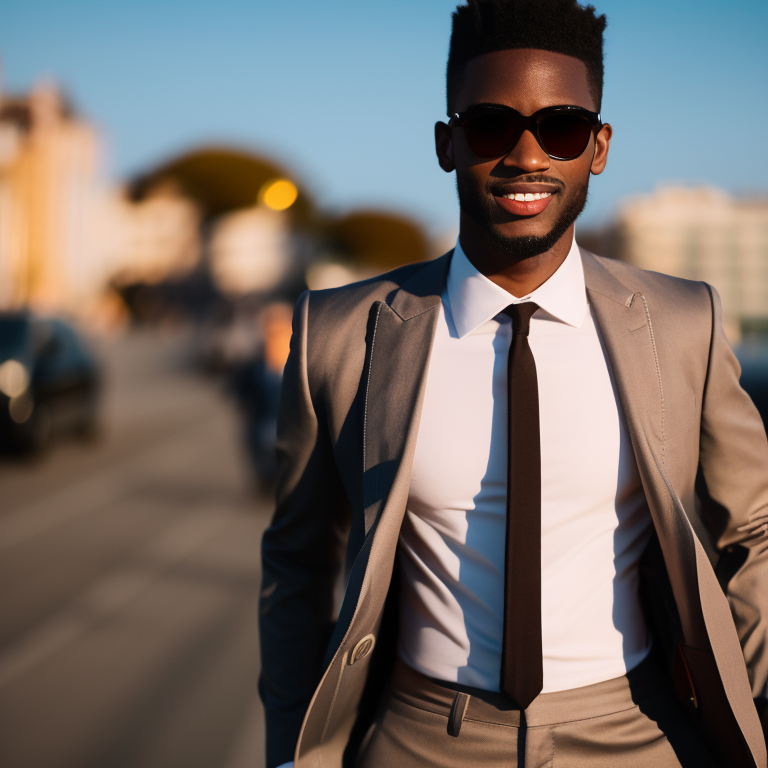

In [ ]:
prompt = "a young man in the street, wearing a suit and sunglasses, side light, golden hour"
neg_prompt = "ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"

img = sd21(prompt,
          negative_prompt=neg_prompt,
          generator=torch.Generator("cuda").manual_seed(seed),
          num_inference_steps=35).images[0]
img

  0%|          | 0/35 [00:00<?, ?it/s]

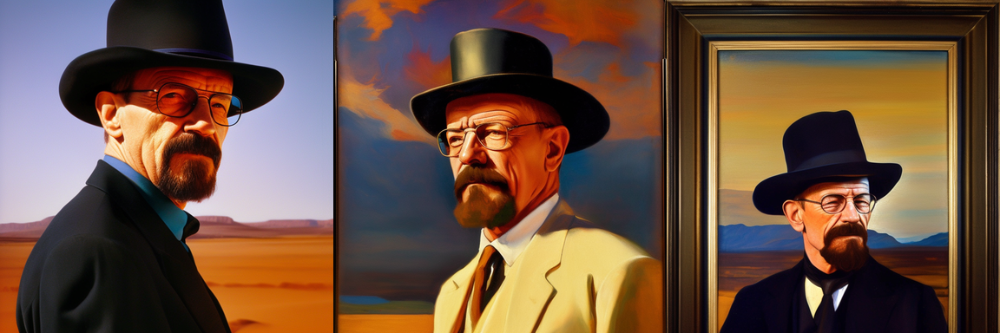

In [ ]:
prompt = "oil painting walter white wearing a suit and black hat, by Alphonse Mucha, face portrait, in the desert, realistic, vivid, fantasy, Surrealist"
neg_prompt = "out of frame, out of image, unrealistic, bad anatomy, ugly, deformed, desfigured, distorted face, poorly drawn hands, poorly drawn face, poorly drawn feet"
num_imgs = 3

generator = torch.Generator("cuda").manual_seed(seed)
imgs = sd21(prompt,
             num_images_per_prompt=num_imgs,
             generator=generator,
             negative_prompt = neg_prompt,
             num_inference_steps=35).images

grid = grid_img(imgs, rows=1, cols=num_imgs, scale=0.5)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

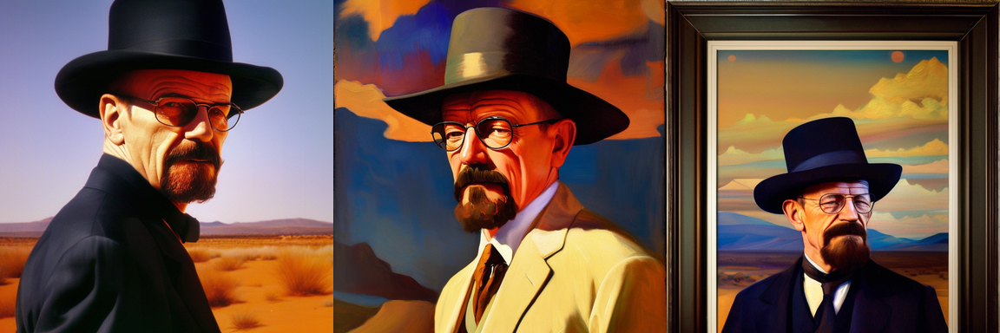

In [ ]:
prompt = "oil painting walter white wearing a suit and black hat, by Alphonse Mucha, face portrait, in the desert, realistic, vivid, fantasy, Surrealist"
neg_prompt = "out of frame, out of image, unrealistic, bad anatomy, ugly, deformed, desfigured, distorted face, poorly drawn hands, poorly drawn face, poorly drawn feet"
num_imgs = 3

generator = torch.Generator("cuda").manual_seed(seed)
imgs = sd21(prompt,
             num_images_per_prompt=num_imgs,
             generator=generator,
             negative_prompt = neg_prompt,
             num_inference_steps=50).images

grid = grid_img(imgs, rows=1, cols=num_imgs, scale=0.5)
grid

In [ ]:
from diffusers import DDIMScheduler
sd21.scheduler = DDIMScheduler.from_config(sd21.scheduler.config)

In [ ]:
from diffusers import EulerAncestralDiscreteScheduler
sd21.scheduler = EulerAncestralDiscreteScheduler.from_config(sd21.scheduler.config)

  0%|          | 0/35 [00:00<?, ?it/s]

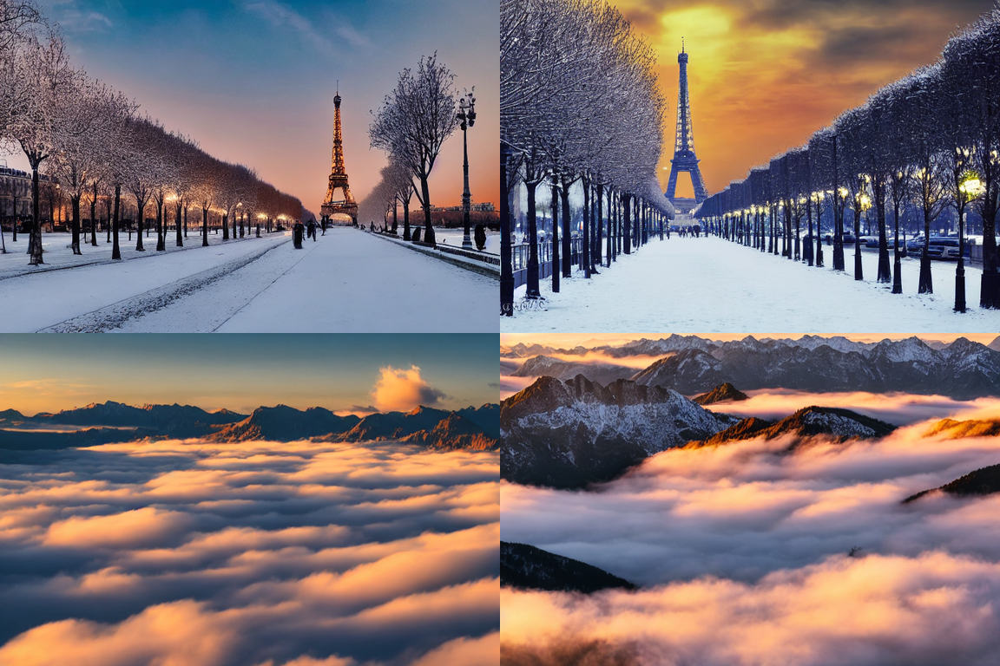

In [ ]:
prompt = ["photograph of snow in paris, realistic, landscape, sunset",
          "photograph of a mountain landscape during sunset, above the clouds"]

num_imgs = 2
h, w = 512, 768

generator = torch.Generator("cuda").manual_seed(seed)

imgs = pipe(prompt,
             num_images_per_prompt=num_imgs,
             generator=generator,
             height=h, width=w,
             num_inference_steps=35).images

grid = grid_img(imgs, rows=len(prompt), cols=num_imgs, scale=0.75)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

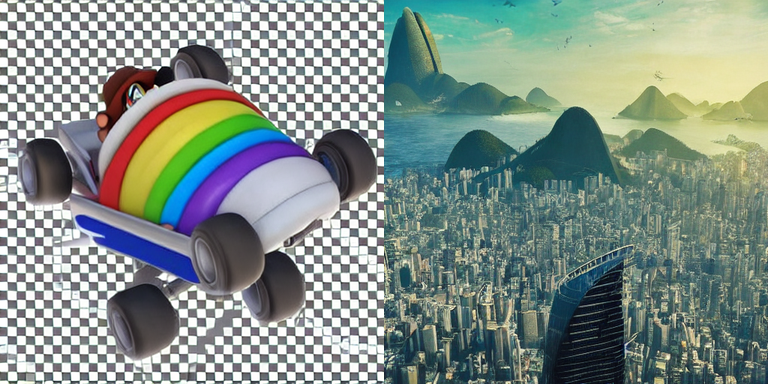

In [6]:
prompt = ["a highly detailed epic cinematic concept png mario kart glowing,radiant flourescent rainbow road going to the horizon",
          "futuristic rio de janeiro, realistic, art station, cinematic, concept art, skyscrapers, landscape, highly detailed artwork"
          ]

generator = torch.Generator("cuda").manual_seed(seed)
imgs = pipe(prompt,
             generator=generator,
             num_inference_steps=50).images

grid = grid_img(imgs, rows=1, cols=len(prompt), scale=0.75)
grid

## Improving the results using custom models

* Also called as fine-tuned models.
* Depending on the model chosen, it may generate inappropriate images if certain words are chosen. In this case they are classified as NSFW (*not safe for work*) and as a result a black image is returned. Therefore, if you want to disable it (at your onw risk) you can add the following: `pipe.safety_checker = None`. In those cases, if the model has this bias it may be necessary to put terms like `naked` in the negative prompt.



### Some models

* **Anything** (`cag/anything-v3-1`) - Anime and comics style images, often used to generate new characters.
 * https://huggingface.co/cag/anything-v3-1

* **DreamShaper** (`Lykon/DreamShaper`) - A "mix" model that encompasses various styles, from photorealism to anime and specific illustration styles.
 * https://huggingface.co/Lykon/DreamShaper

* **Realistic Vision** (`SG161222/Realistic_Vision_V1.4`) - focus on photorealism, high degree of realism and definition to images that simulate professional photographs.
 * https://huggingface.co/SG161222/Realistic_Vision_V1.4

* **Analog Diffusion** (`wavymulder/Analog-Diffusion`) -
Model trained with dreambooth, using a dataset of analog photographs. The generated images will have that aspect of analogue photography and film.
 * https://huggingface.co/wavymulder/Analog-Diffusion

* **Protogen** (`darkstorm2150/Protogen_x3.4_Official_Release`) - encompasses several styles, but it is mostly used to simulate degrees of realism.
 * https://huggingface.co/darkstorm2150/Protogen_x3.4_Official_Release

* **Mitsua Diffusion One** (`Mitsua/mitsua-diffusion-one`) - The most "ethical" model possible as it is under the CC0 license (safe to use). It is a model that is more concerned with this issue, so all data for training was obtained in accordance with the terms and conditions of its authors.
 * https://huggingface.co/Mitsua/mitsua-diffusion-one


> More and more models here: https://huggingface.co/models?library=diffusers



> **Realistic Vision** (`SG161222/Realistic_Vision_V1.4`)

* Recommended keywords: `8k uhd, dslr, soft lighting, high quality, film grain, Fujifilm XT3`.

In [7]:
from diffusers import EulerAncestralDiscreteScheduler

ds = StableDiffusionPipeline.from_pretrained("SG161222/Realistic_Vision_V1.4", torch_dtype=torch.float32)
ds = ds.to("cuda")
ds.enable_attention_slicing()
ds.scheduler = EulerAncestralDiscreteScheduler.from_config(ds.scheduler.config)

vae/diffusion_pytorch_model.safetensors not found


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/75 [00:00<?, ?it/s]

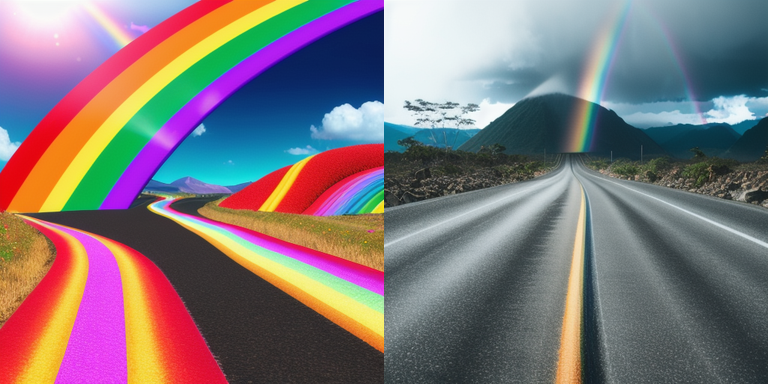

In [10]:
prompt = ["a highly detailed epic cinematicrainbow road png, 8k uhd, dslr, soft lighting, high quality, film grain, Fujifilm XT3",
          " rainbow road png, 8k uhd, dslr, soft lighting, high quality, film grain, Fujifilm XT3",]

neg_prompt = ["low resolution,low quality"] * len(prompt)

generator = torch.Generator("cuda").manual_seed(44124)
ds.safety_checker = None
imgs = ds(prompt,
          negative_prompt=neg_prompt,
          generator=generator,
          guidance_scale=7.5,
          num_inference_steps=75).images

grid = grid_img(imgs, rows=1, cols=len(prompt), scale=0.75)
grid